In [1]:
!pip install opencv-contrib-python
!pip install diffusers transformers accelerate

In [2]:
from diffusers import StableDiffusionControlNetInpaintPipeline, ControlNetModel
from diffusers.utils import load_image
import numpy as np
import torch
import torchvision
import random

image = load_image(
    "/content/drive/MyDrive/tile_original.jpeg"
)
image = image.resize((1024, 1024))
width, height = image.size

generator = torch.Generator(device="cpu").manual_seed(1)




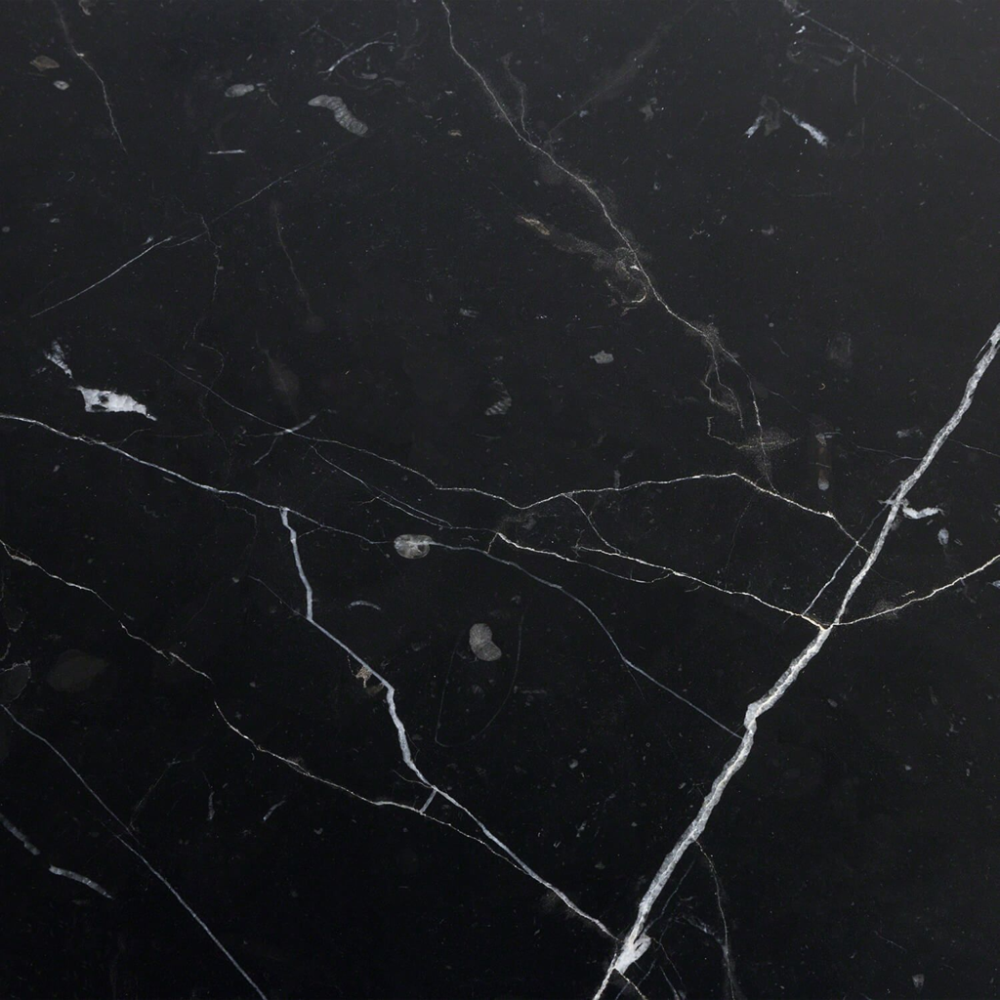

In [3]:
image

In [4]:
def mask_generator(width, height):
  mask_length = random.randint(min(width, height) // 2, min(width, height)// 1)
  mask_x = random.randint(0, width - mask_length)
  mask_y = random.randint(0, height - mask_length)
  mask = torch.zeros(width, height)
  mask[mask_y: mask_y + mask_length, mask_x: mask_x + mask_length] = 1.0
  return mask


In [5]:
def new_mask_generator(width, height):
  masks = []
  mask_w = width // 3
  mask_h = height // 3
  for i in range(3):
    for j in range(3):
      mask = torch.zeros(width, height)
      mask[i*mask_h: (i+1)*mask_h, j*mask_w: (j+1)*mask_w] = 1.0
      mask = torchvision.transforms.functional.to_pil_image(mask)
      masks.append(mask)
  return masks

In [8]:
masks = []
for i in range(9):
  mask = mask_generator(width, height)
  mask = torchvision.transforms.functional.to_pil_image(mask)
  masks.append(mask)

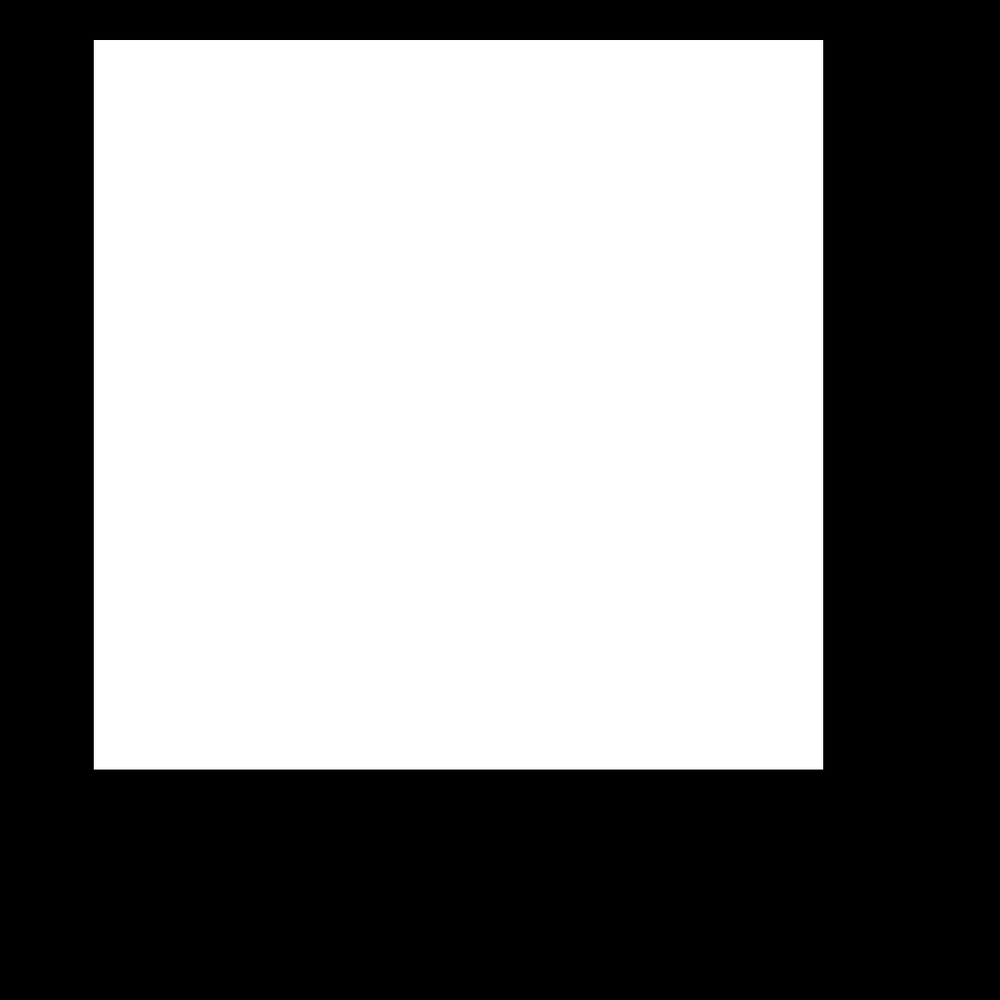

In [9]:
masks[3]

In [10]:
from diffusers import AutoPipelineForInpainting
from diffusers.utils import load_image
import torch
import PIL
image_list = []
pipe = AutoPipelineForInpainting.from_pretrained("diffusers/stable-diffusion-xl-1.0-inpainting-0.1", torch_dtype=torch.float16, variant="fp16").to("cuda")

for i in range(9):
  prompt = ""
  generator = torch.Generator(device="cuda").manual_seed(0)
  k = random.randint(0,3)
  image = image.rotate(90*k, PIL.Image.NEAREST, expand = 1)
  new_image = pipe(
    prompt=prompt,
    image=image,
    mask_image=masks[i],
    guidance_scale=0.0,
    num_inference_steps=20,  # steps between 15 and 30 work well for us
    strength=0.99,  # make sure to use `strength` below 1.0
    generator=generator,
  ).images[0]
  image_list.append(new_image)


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

The config attributes {'decay': 0.9999, 'inv_gamma': 1.0, 'min_decay': 0.0, 'optimization_step': 37000, 'power': 0.6666666666666666, 'update_after_step': 0, 'use_ema_warmup': False} were passed to UNet2DConditionModel, but are not expected and will be ignored. Please verify your config.json configuration file.


  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

In [11]:
from PIL import Image

new_im = Image.new('RGB', (3096, 3096))
x_offset = 0
y_offset = 0
for i in range(3):
  for j in range(3):
    new_im.paste(image_list[i*3 + j], (i*1024,j*1024))

new_im.resize((1024,1024), Image.Resampling.LANCZOS).save("trial.png")

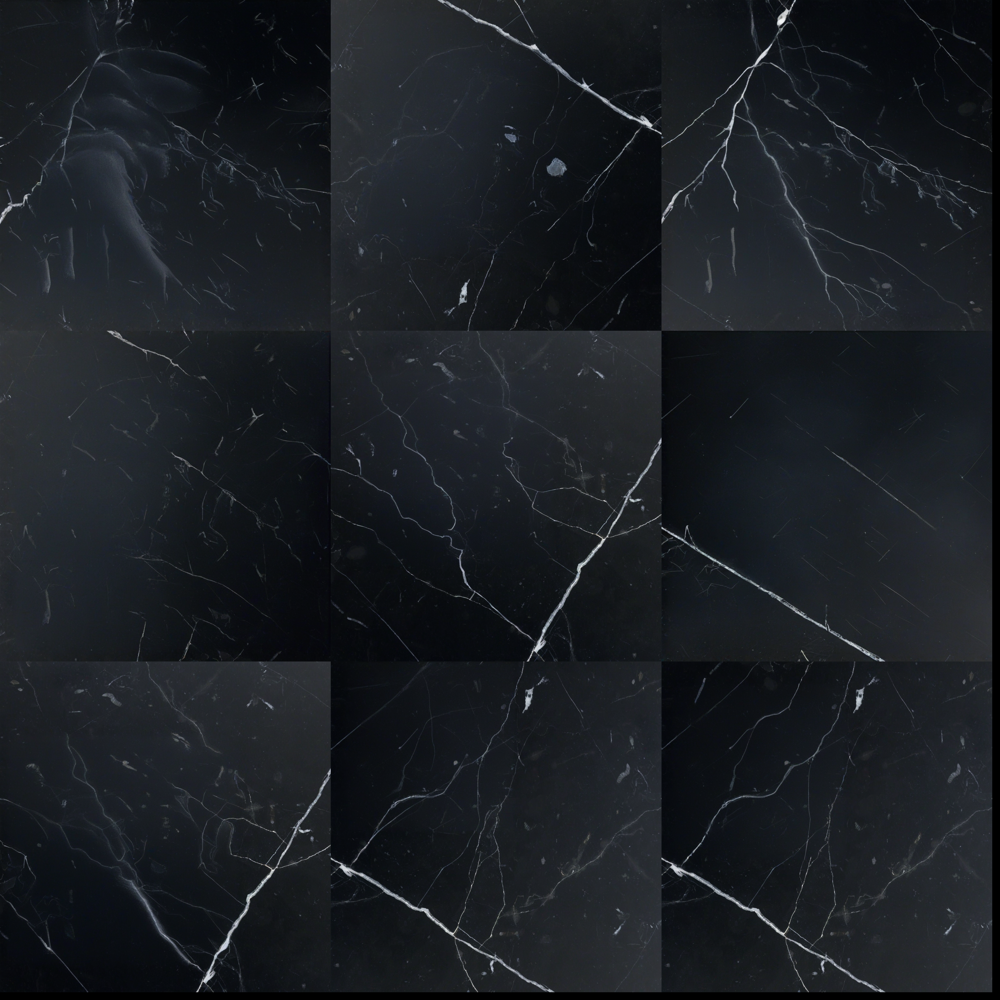

In [12]:
new_im